In [ ]:
from numpy import unique
from numpy import where
from sklearn.datasets import make_classification
from sklearn.cluster import AgglomerativeClustering
from matplotlib import pyplot

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [ ]:
import os
os.chdir('drive/MyDrive/dataset/')
print(os.getcwd())

/content/drive/MyDrive/dataset


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


In [ ]:
import math
plt.rcParams['figure.figsize'] = [20, 15]
plt.rcParams['figure.dpi'] = 100 # 200 e.g. is really fine, but slower
class PlotImages:
  def __init__(self, col=10):
    self.fig = plt.figure()
    self.col = col
  
  def get_subplot(self, no):
    self.fig = plt.figure()
    subplots = []
    r = math.ceil(no/self.col)
    for i in range(no):
      subplots.append(self.fig.add_subplot(r,self.col,i+1))
    return subplots
  
  def draw(self, images):
    subplots = self.get_subplot(len(images))
    for i in range(len(images)):
      img = plt.imread(images[i], 0)
      subplots[i].imshow(img)
      subplots[i].axis('off')
      plt.subplot(subplots[i])
    plt.show()


In [ ]:
def get_x(image_path, height, width):
    img = load_img(image_path, target_size=(height, width))
    x = img_to_array(img)
    return x.flatten()

In [ ]:
def convert_to_numpy(height=150, width=150):
  my_data = []
  pt = 'train/ec'
  for i in os.listdir(pt):
    my_data.append(get_x(f'{pt}/{i}', height, width))
  return np.array(my_data)


In [ ]:
import numpy as np

In [ ]:
data = convert_to_numpy()

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [ ]:
data.shape

(187, 67500)

# Agglomerative Clustering
Agglomerative clustering involves merging examples until the desired number of clusters is achieved.

In [ ]:
model = AgglomerativeClustering(n_clusters=2)
# fit model and predict clusters
yhat = model.fit_predict(d_data)
# retrieve unique clusters
clusters = unique(yhat)

In [ ]:
train = os.listdir('train/ec')
TRAIN = [f'train/ec/{i}' for i in train]
def evaluate_model(predicted, groups):
  print(f'{len(groups)} Clusters have been found')
  group_dict = {}
  for i in groups:
    group_dict[i] = where(predicted == i)[0]
    l = len(group_dict[i])
    print(f'Length of Cluster {i} is {l}')
  my_groups = []
  for k,v in group_dict.items():
    my_groups.append([TRAIN[i] for i in v])
  return my_groups


In [ ]:
gr = evaluate_model(yhat, clusters)

2 Clusters have been found
Length of Cluster 0 is 108
Length of Cluster 1 is 79


In [ ]:
my_plot = PlotImages(col=7)

<Figure size 2000x1500 with 0 Axes>

## Plotting Cluster 0 (Agglomerative)

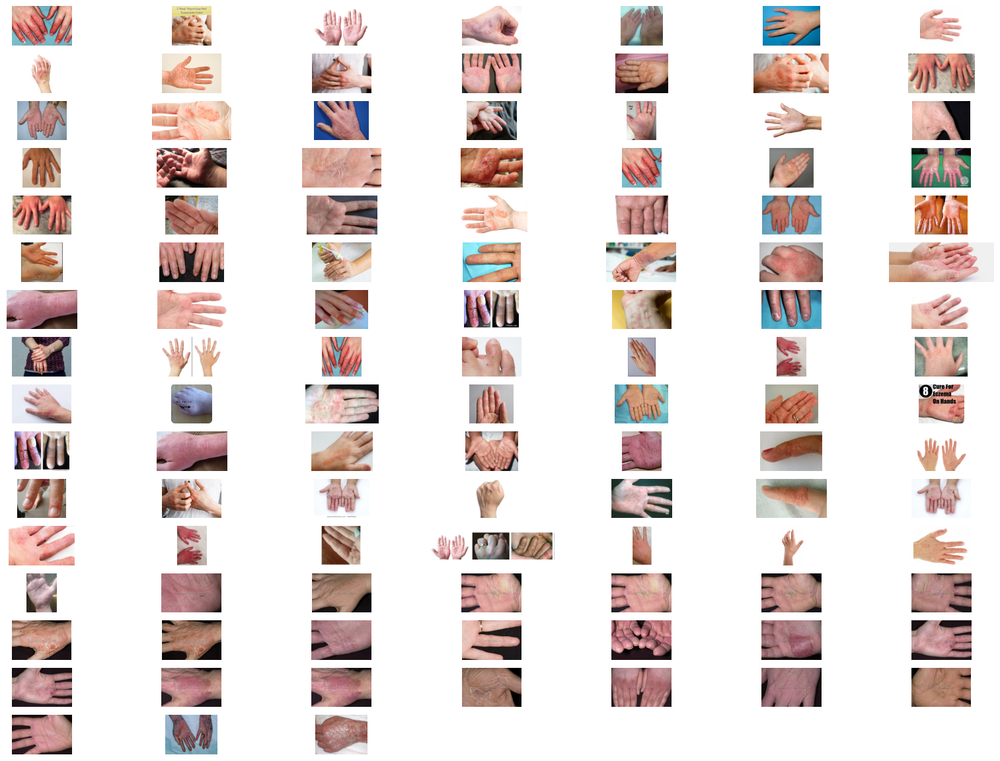

In [ ]:
my_plot.draw(gr[0])

## Plotting Cluster 1 (Agglomerative)

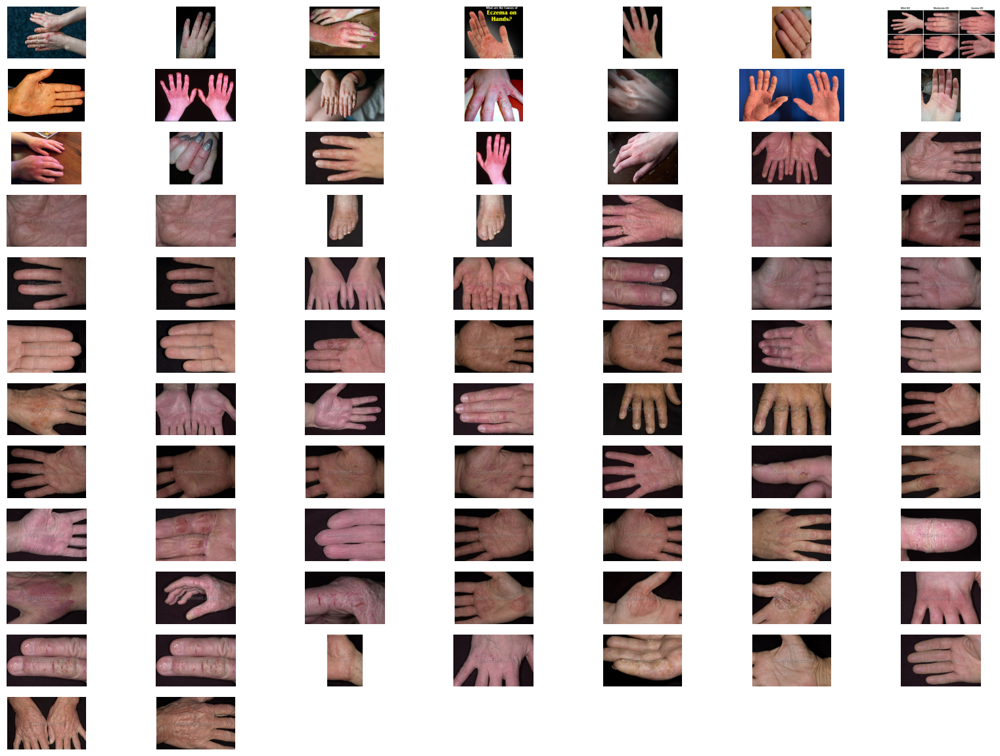

In [ ]:
my_plot.draw(gr[1])

# BIRCH Cluster
BIRCH Clustering (BIRCH is short for Balanced Iterative Reducing and Clustering using
Hierarchies) involves constructing a tree structure from which cluster centroids are extracted.

In [ ]:
from sklearn.cluster import Birch

In [ ]:
# define the model
model = Birch(threshold=0.01, n_clusters=2)
# fit the model
model.fit(d_data)
# assign a cluster to each example
preds = model.predict(d_data)
# retrieve unique clusters
clusters = unique(preds)

In [ ]:
birch_ = evaluate_model(preds, clusters)

2 Clusters have been found
Length of Cluster 0 is 69
Length of Cluster 1 is 118


## Plotting Cluster 0 (Birch)

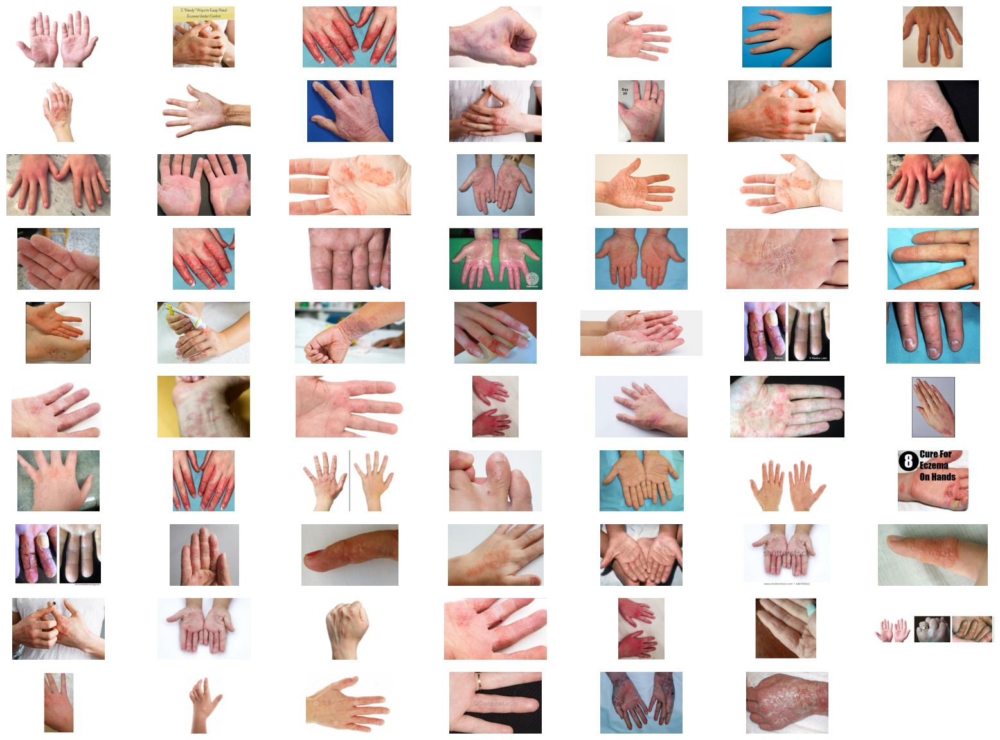

In [ ]:
my_plot.draw(birch_[0])

## Plotting Cluster 1 (Birch)

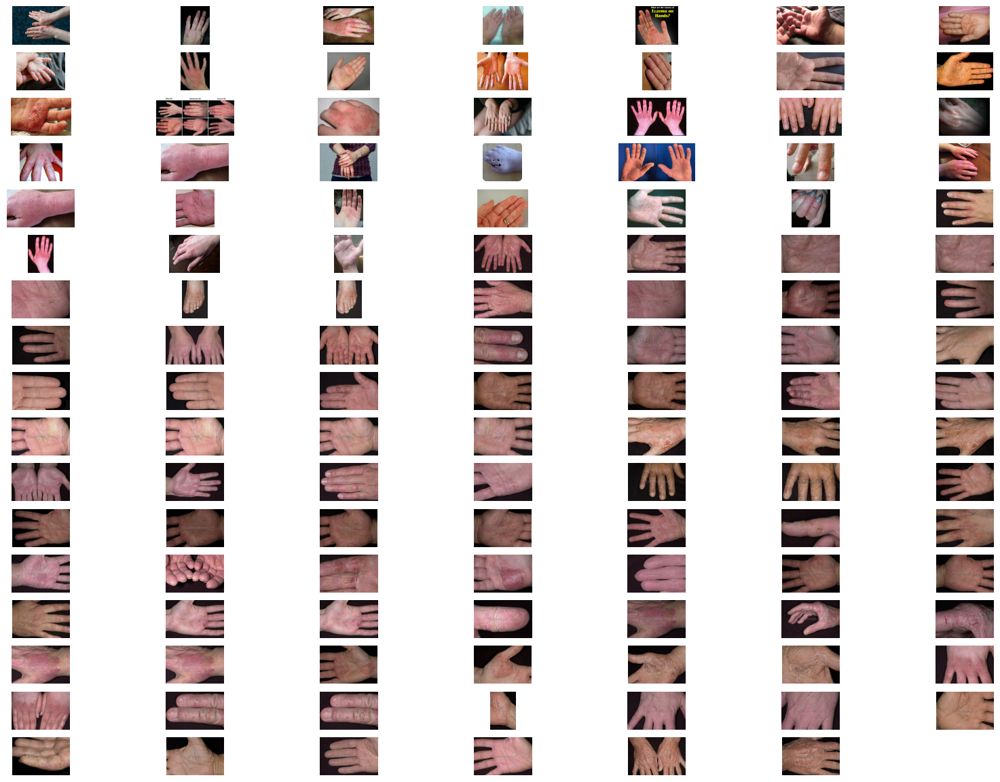

In [ ]:
my_plot.draw(birch_[1])

# DBSCAN Clustering
DBSCAN Clustering (where DBSCAN is short for Density-Based Spatial Clustering of Applications with Noise) involves finding high-density areas in the domain and expanding those areas of the feature space around them as clusters.

In [ ]:
from sklearn.cluster import DBSCAN

In [ ]:
# define the model
model = DBSCAN(eps=0.80, min_samples=5)
# fit model and predict clusters
preds = model.fit_predict(d_data)
# retrieve unique clusters
clusters = unique(preds)

In [ ]:
dbscan = evaluate_model(preds, clusters)

1 Clusters have been found
Length of Cluster -1 is 187


# K-Means
K-Means Clustering may be the most widely known clustering algorithm and involves assigning examples to clusters in an effort to minimize the variance within each cluster.

In [ ]:
from sklearn.cluster import KMeans

In [ ]:
# define the model
model = KMeans(n_clusters=2)
# fit the model
model.fit(d_data)
# assign a cluster to each example
preds = model.predict(d_data)
# retrieve unique clusters
clusters = unique(preds)

In [ ]:
kmeans = evaluate_model(preds, clusters)

2 Clusters have been found
Length of Cluster 0 is 118
Length of Cluster 1 is 69


## Plotting Cluster 0 (Kmeans)

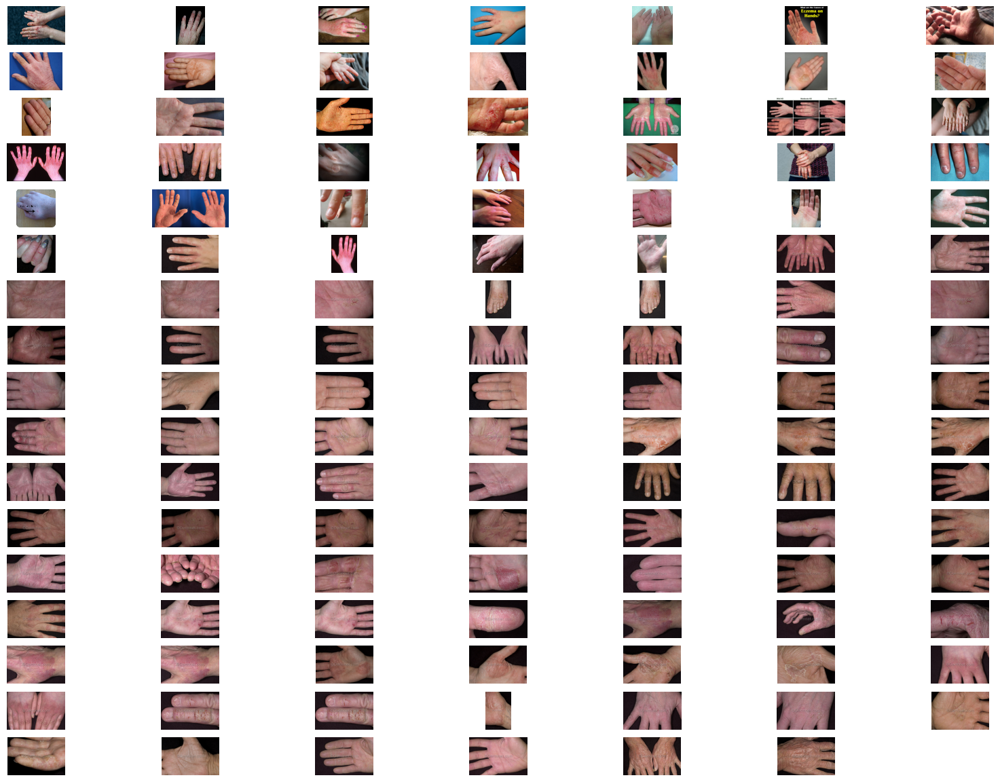

In [ ]:
my_plot.draw(kmeans[0])

## Plotting Cluster 1 (Kmeans)

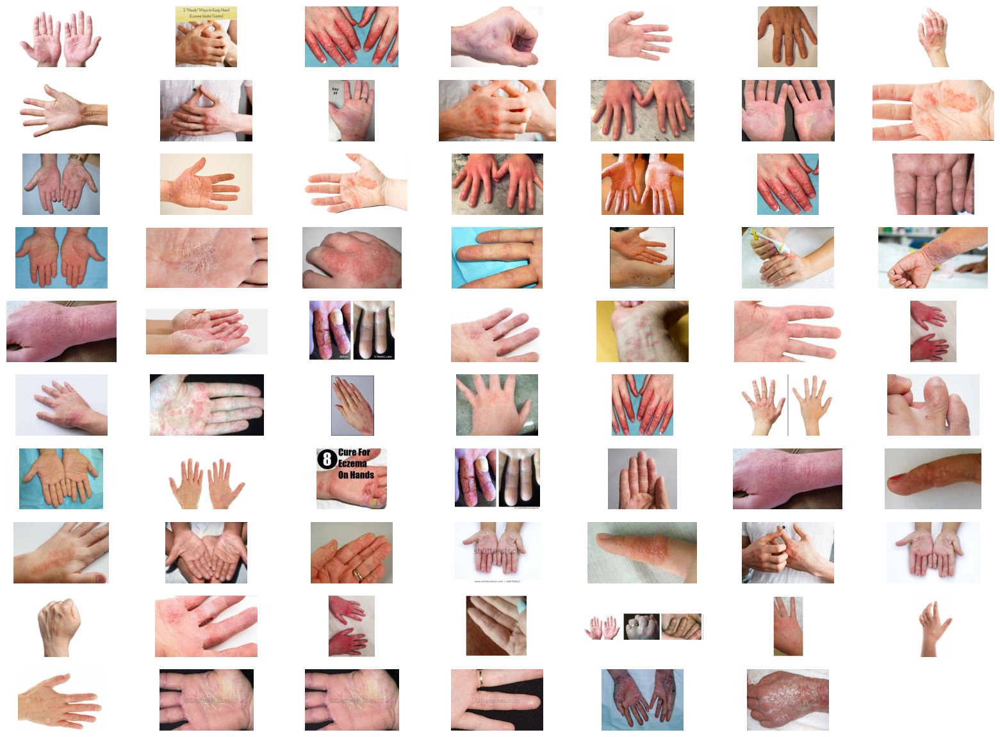

In [ ]:
my_plot.draw(kmeans[1])

# Mini-Batch K-Means
Mini-Batch K-Means is a modified version of k-means that makes updates to the cluster centroids using mini-batches of samples rather than the entire dataset, which can make it faster for large datasets, and perhaps more robust to statistical noise.

In [ ]:
from sklearn.cluster import MiniBatchKMeans

In [ ]:
# define the model
model = MiniBatchKMeans(n_clusters=2)
# fit the model
model.fit(d_data)
# assign a cluster to each example
preds = model.predict(d_data)
# retrieve unique clusters
clusters = unique(preds)

In [ ]:
mini_km = evaluate_model(preds, clusters)

2 Clusters have been found
Length of Cluster 0 is 120
Length of Cluster 1 is 67


# Plotting Cluster 0 (MiniBatchKmeans)

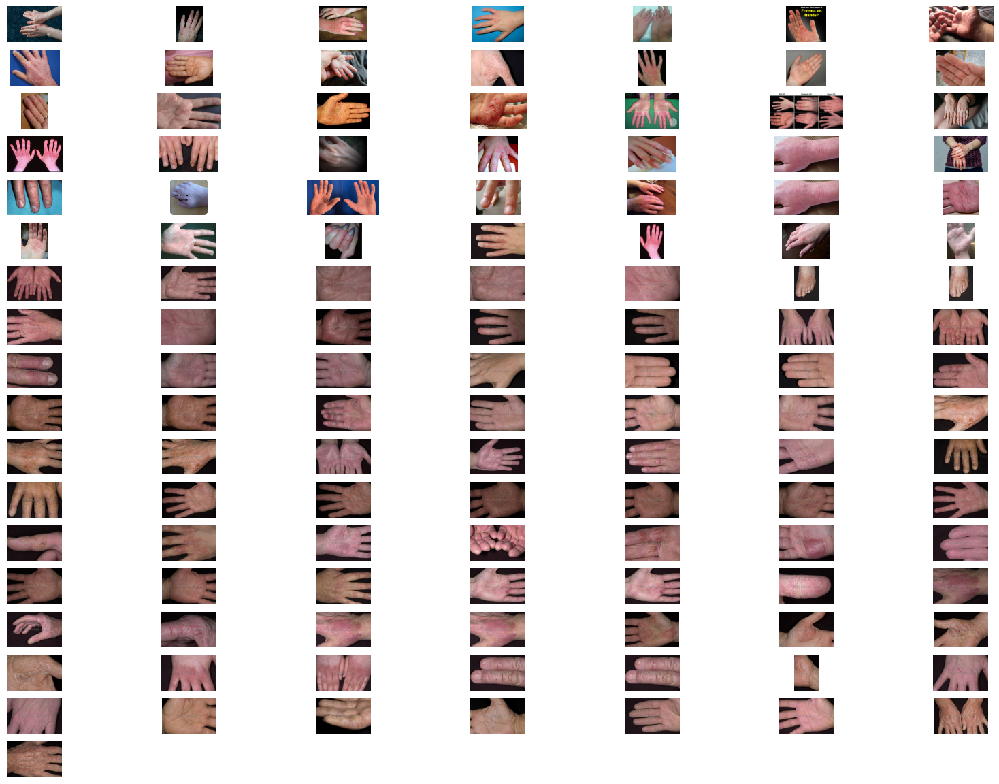

In [ ]:
my_plot.draw(mini_km[0])

# Plotting Cluster 1 (MiniBatchKmeans)

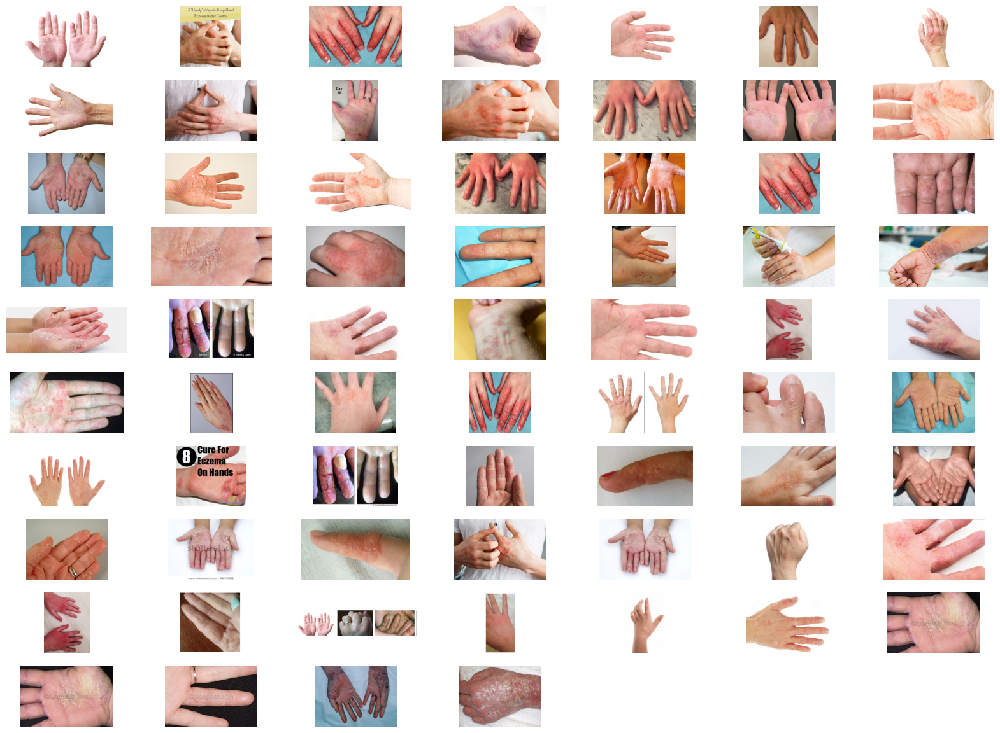

In [ ]:
my_plot.draw(mini_km[1])

# Mean Shift
Mean shift clustering involves finding and adapting centroids based on the density of examples in the feature space.

In [ ]:
from sklearn.cluster import MeanShift

In [ ]:
# define the model
model = MeanShift()
# fit model and predict clusters
preds = model.fit_predict(d_data)
# retrieve unique clusters
clusters = unique(preds)

In [ ]:
meanshift = evaluate_model(preds, clusters)

6 Clusters have been found
Length of Cluster 0 is 161
Length of Cluster 1 is 2
Length of Cluster 2 is 21
Length of Cluster 3 is 1
Length of Cluster 4 is 1
Length of Cluster 5 is 1


# Plotting Cluster 0 (Meanshift)

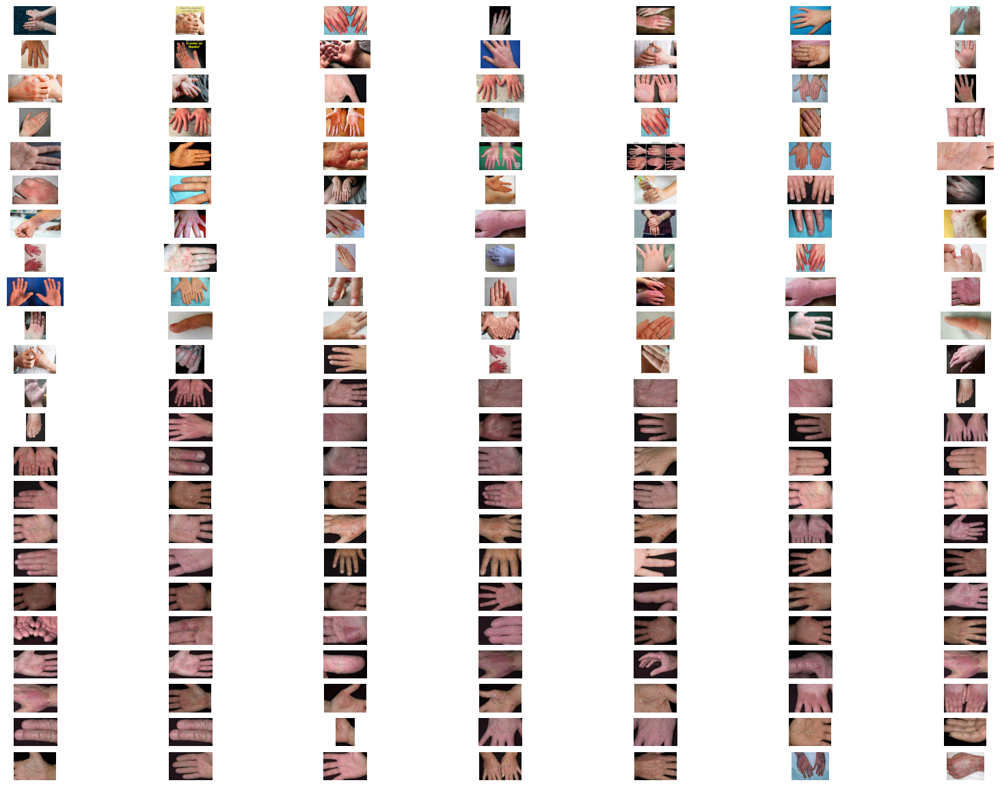

In [ ]:
my_plot.draw(meanshift[0])

# Plotting Cluster 1 (Meanshift)

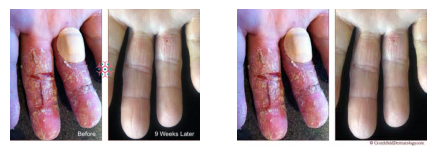

In [ ]:
my_plot.draw(meanshift[1])

# Plotting Cluster 2 (Meanshift)

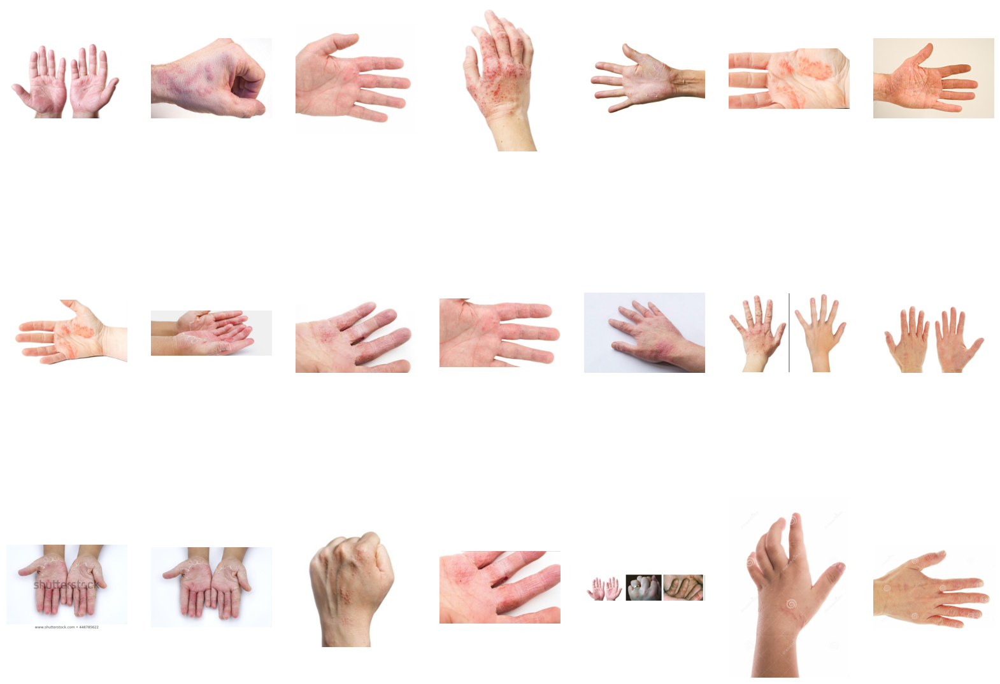

In [ ]:
my_plot.draw(meanshift[2])

# Plotting Cluster 3 (Meanshift)

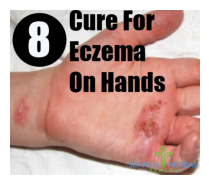

In [ ]:
my_plot.draw(meanshift[3])

# Plotting Cluster 4 (Meanshift)

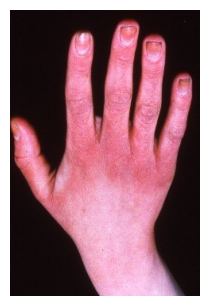

In [ ]:
my_plot.draw(meanshift[4])

# Plotting Cluster 5 (Meanshift)

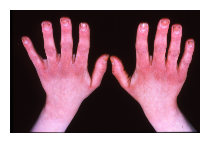

In [ ]:
my_plot.draw(meanshift[5])

# OPTICS
OPTICS clustering (where OPTICS is short for Ordering Points To Identify the Clustering Structure) is a modified version of DBSCAN described above.

In [ ]:
from sklearn.cluster import OPTICS

In [ ]:
# define the model
model = OPTICS(eps=0.8, min_samples=10)
# fit model and predict clusters
preds = model.fit_predict(d_data)
# retrieve unique clusters
clusters = unique(preds)

In [ ]:
optics = evaluate_model(preds, clusters)

1 Clusters have been found
Length of Cluster 0 is 187


# Spectral Clustering
Spectral Clustering is a general class of clustering methods, drawn from linear algebra.

In [ ]:
from sklearn.cluster import SpectralClustering

In [ ]:
# define the model
model = SpectralClustering(n_clusters=2)
# fit model and predict clusters
preds = model.fit_predict(d_data)
# retrieve unique clusters
clusters = unique(preds)

/usr/local/lib/python3.6/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


In [ ]:
sc = evaluate_model(preds, clusters)

2 Clusters have been found
Length of Cluster 0 is 185
Length of Cluster 1 is 2


Plotting Cluster 1 (Spectral Clustering)

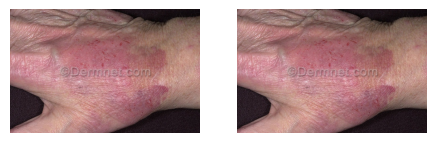

In [ ]:
my_plot.draw(sc[1])

# Gaussian Mixture Model
A Gaussian mixture model summarizes a multivariate probability density function with a mixture of Gaussian probability distributions as its name suggests.

In [ ]:
from sklearn.mixture import GaussianMixture

In [ ]:
d_data = convert_to_numpy(50,50)

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [ ]:
# define the model
model = GaussianMixture(n_components=2)
# fit the model
model.fit(d_data)
# assign a cluster to each example
preds = model.predict(d_data)
# retrieve unique clusters
clusters = unique(preds)

In [ ]:
gm = evaluate_model(preds, clusters)

2 Clusters have been found
Length of Cluster 0 is 67
Length of Cluster 1 is 120


Plotting Cluster 0 (GaussianMixture)

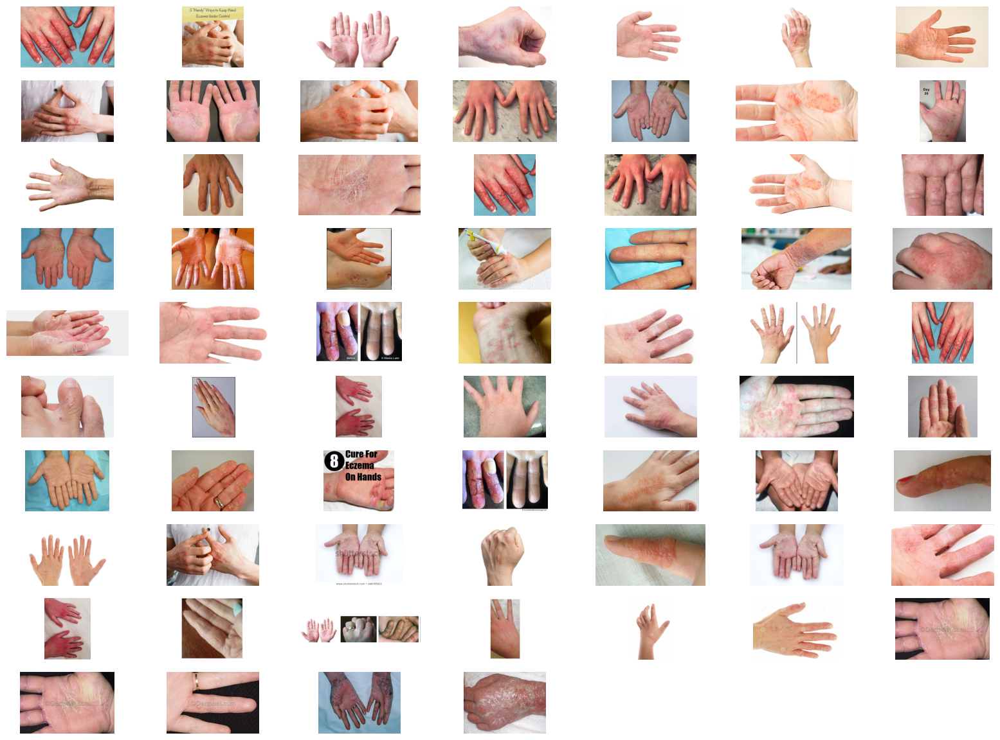

In [ ]:
my_plot.draw(gm[0])

Plotting Cluster 1 (GaussianMixture)

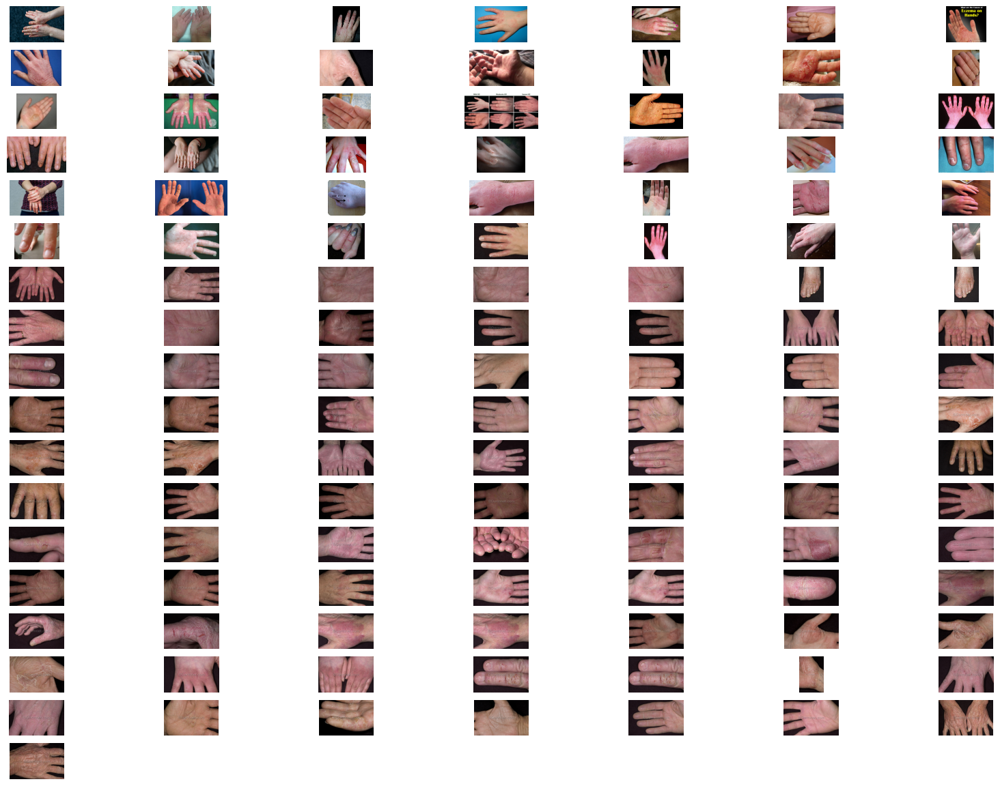

In [ ]:
my_plot.draw(gm[1])